<a href="https://colab.research.google.com/github/brian-ho/intro-to-urban-data/blob/main/Open_an_Image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install pillow-heif
!pip install geoplot

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 111.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 83.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 5.5 MB/s eta 0:00:00


In [3]:
import os
import matplotlib.pyplot as plt
from PIL import Image
from PIL.ExifTags import TAGS, GPSTAGS, IFD
from pillow_heif import register_heif_opener
import geopandas as gpd
import pandas as pd
import geoplot
from shapely.geometry import Point

register_heif_opener()

IMG_4106.HEIC
IMG_4108.HEIC


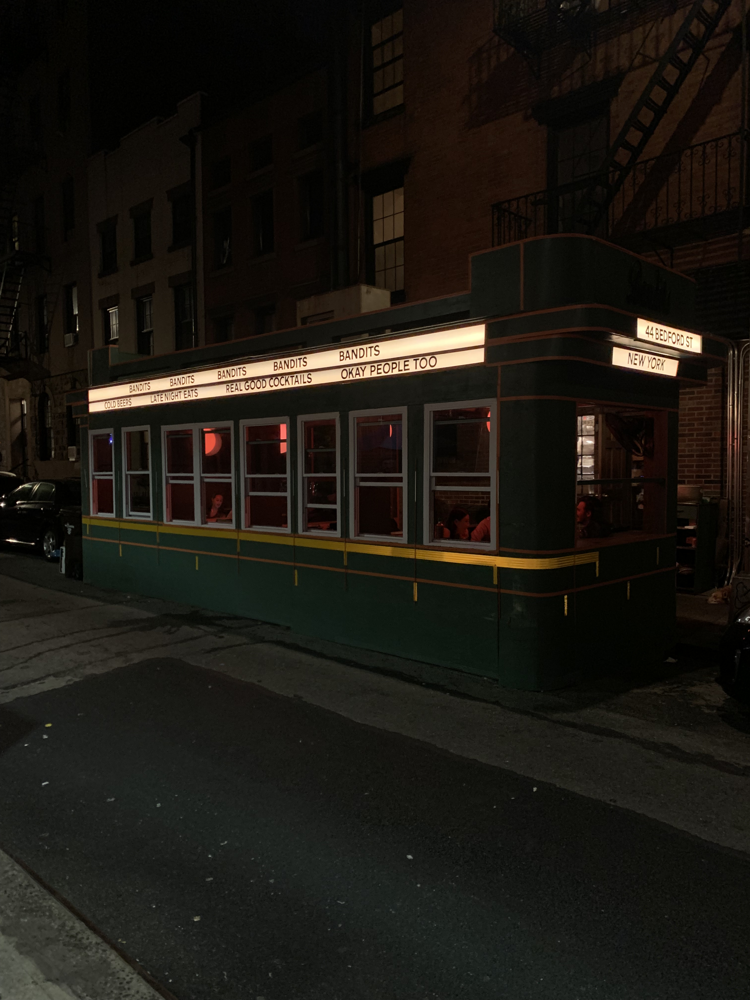

In [4]:
directory = '/content/drive/MyDrive/Cornell AAP - MSAUD/Colab Notebooks/Example Data/'

for img_file in os.listdir(directory):
  img = Image.open(directory + img_file)
  print(img_file)

img

In [5]:
def parse_degrees_to_decimals(degrees):
  return degrees[0] + degrees[1] / 60 + (degrees[2] / 60) * 0.0001

In [6]:
images_data = []

for img_file in os.listdir(directory):
  img = Image.open(directory + img_file)
  img_exif = img.getexif()
  print(f'\n======{img_file}======')

  image_data = {
    'latitude': None,
    'longitude': None,
    'name': img_file,
  }

  for k, v in img_exif.items():
      tag = TAGS.get(k, k)
      print(tag, v)

  for ifd_id in IFD:
      try:
          ifd = img_exif.get_ifd(ifd_id)

          if ifd_id == IFD.GPSInfo:
              print('\n------GPS INFO------')
              resolve = GPSTAGS

              for k, v in ifd.items():
                  tag = resolve.get(k, k)
                  print(tag, v)

                  if tag == 'GPSLatitude':
                        image_data['latitude'] = parse_degrees_to_decimals(v)

                  if tag == 'GPSLongitude':
                        image_data['longitude'] = parse_degrees_to_decimals(v)
      except KeyError:
          pass

  if all(v is not None for v in image_data.values()):
      images_data.append(image_data)


======IMG_4106.HEIC======
GPSInfo 2084
ResolutionUnit 2
ExifOffset 228
Make Apple
Model iPhone XS
Software 14.7.1
Orientation 1
DateTime 2021:10:02 19:48:55
YCbCrPositioning 1
XResolution 72.0
YResolution 72.0
HostComputer iPhone XS

------GPS INFO------
GPSLatitudeRef N
GPSLatitude (40.0, 43.0, 49.51)
GPSLongitudeRef W
GPSLongitude (74.0, 0.0, 15.52)
GPSAltitudeRef b'\x00'
GPSAltitude 5.563342258899961
GPSSpeedRef K
GPSSpeed 0.33479237554094676
GPSImgDirectionRef T
GPSImgDirection 54.84037396121884
GPSDestBearingRef T
GPSDestBearing 54.84037396121884
GPSDateStamp 2021:10:02
GPSHPositioningError 13.28906052165105

======IMG_4108.HEIC======
GPSInfo 2084
ResolutionUnit 2
ExifOffset 228
Make Apple
Model iPhone XS
Software 14.7.1
Orientation 1
DateTime 2021:10:02 19:49:12
YCbCrPositioning 1
XResolution 72.0
YResolution 72.0
HostComputer iPhone XS

------GPS INFO------
GPSLatitudeRef N
GPSLatitude (40.0, 43.0, 49.92)
GPSLongitudeRef W
GPSLongitude (74.0, 0.0, 15.27)
GPSAltitudeRef b'\x00'


In [45]:
df = gpd.GeoDataFrame(images_data)
df.geometry = df.apply(lambda x: Point(-x['longitude'], x['latitude']), axis=1)
df = df.set_crs(4326)
df

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:203: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_geometry('geometry')` to explicitly set the active geometry column.
  object.__setattr__(self, attr, val)


,latitude,longitude,name,geometry
0,40.716749,74.000026,IMG_4106.HEIC,POINT (-74.00003 40.71675)
1,40.716750,74.000025,IMG_4108.HEIC,POINT (-74.00003 40.71675)


EPSG:4326


<Axes: >

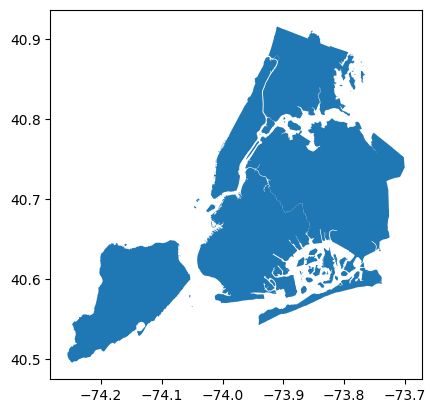

In [46]:
nyc = gpd.read_file(geoplot.datasets.get_path('nyc_boroughs'))
print(nyc.crs)
nyc.plot()

<Axes: >

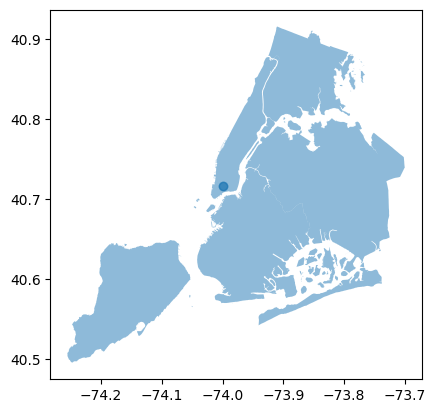

In [49]:
pd.concat([df, nyc]).plot(alpha=0.5)